<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Question-1" data-toc-modified-id="Question-1-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Question 1</a></span><ul class="toc-item"><li><span><a href="#Get-Data" data-toc-modified-id="Get-Data-1.1"><span class="toc-item-num">1.1&nbsp;&nbsp;</span>Get Data</a></span></li><li><span><a href="#Preprocessing-(document)" data-toc-modified-id="Preprocessing-(document)-1.2"><span class="toc-item-num">1.2&nbsp;&nbsp;</span>Preprocessing (document)</a></span></li><li><span><a href="#Bag-of-words" data-toc-modified-id="Bag-of-words-1.3"><span class="toc-item-num">1.3&nbsp;&nbsp;</span>Bag of words</a></span></li><li><span><a href="#TF" data-toc-modified-id="TF-1.4"><span class="toc-item-num">1.4&nbsp;&nbsp;</span>TF</a></span></li><li><span><a href="#IDF" data-toc-modified-id="IDF-1.5"><span class="toc-item-num">1.5&nbsp;&nbsp;</span>IDF</a></span></li><li><span><a href="#TF-IDF" data-toc-modified-id="TF-IDF-1.6"><span class="toc-item-num">1.6&nbsp;&nbsp;</span>TF IDF</a></span></li></ul></li><li><span><a href="#Question-2" data-toc-modified-id="Question-2-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Question 2</a></span><ul class="toc-item"><li><span><a href="#Nodes" data-toc-modified-id="Nodes-2.1"><span class="toc-item-num">2.1&nbsp;&nbsp;</span>Nodes</a></span></li><li><span><a href="#Degree-centrality" data-toc-modified-id="Degree-centrality-2.2"><span class="toc-item-num">2.2&nbsp;&nbsp;</span>Degree centrality</a></span></li><li><span><a href="#Betweeness" data-toc-modified-id="Betweeness-2.3"><span class="toc-item-num">2.3&nbsp;&nbsp;</span>Betweeness</a></span></li><li><span><a href="#Closeness" data-toc-modified-id="Closeness-2.4"><span class="toc-item-num">2.4&nbsp;&nbsp;</span>Closeness</a></span></li><li><span><a href="#Degree-prestige" data-toc-modified-id="Degree-prestige-2.5"><span class="toc-item-num">2.5&nbsp;&nbsp;</span>Degree prestige</a></span></li><li><span><a href="#Proximity-prestige" data-toc-modified-id="Proximity-prestige-2.6"><span class="toc-item-num">2.6&nbsp;&nbsp;</span>Proximity prestige</a></span></li></ul></li><li><span><a href="#Question-3" data-toc-modified-id="Question-3-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Question 3</a></span><ul class="toc-item"><li><span><a href="#fix-stoch" data-toc-modified-id="fix-stoch-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>fix stoch</a></span></li></ul></li><li><span><a href="#Question-4" data-toc-modified-id="Question-4-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Question 4</a></span></li></ul></div>

# Question 1

Write a program to extract the contents (excluding any tags) from the following five
websites
- https://en.wikipedia.org/wiki/Web_mining
- https://en.wikipedia.org/wiki/Data_mining
- https://en.wikipedia.org/wiki/Artificial_intelligence
- https://en.wikipedia.org/wiki/Machine_learning
- https://en.wikipedia.org/wiki/Mining
save the content in five separate .doc file. Considering a vector space model and do
the following operations according to the query “Mining of large data”
- Bag-of-Words (Document set)
- TF (Document set)
- IDF (Document set)
- TF-IDF (Document set)
- TF-IDF (Query)
- Normalized (Query)
- Normalized - TF-IDF (Document set)
- Cosine Similarity
- Euclidean Distance
- Document Ranking (Display Order)
- Document Similarity (Among Documents)

## Get Data

In [2]:
import re
import sys
import urllib
from collections import deque
from html.parser import HTMLParser
from urllib import parse
from urllib.request import urlopen

import numpy as np
import pandas as pd
from bs4 import BeautifulSoup

In [2]:
def scrape_save(url, fname):
    urlf = urlopen(url)
    soup = BeautifulSoup(urlf.read(), "lxml")
    with open('data/' + fname, "w+") as f:
        for a in soup.find_all('p'):
            f.write(a.getText() + "\n")

In [3]:
l = [
    'https://en.wikipedia.org/wiki/Web_mining',
    'https://en.wikipedia.org/wiki/Data_mining',
    'https://en.wikipedia.org/wiki/Artificial_intelligence',
    'https://en.wikipedia.org/wiki/Machine_learning',
    'https://en.wikipedia.org/wiki/Mining'
]
file_names = []

In [4]:
for a in l:
    fname = a.split('/')[-1] + '.txt'
    file_names.append(fname)
    scrape_save(a, fname)

In [5]:
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

stop_words = set(stopwords.words('english'))

## Preprocessing (document)

In [6]:
def preprocess(doc):
    rem_stop1 = word_tokenize(doc)
    rem_stop1 = [x.lower() for x in rem_stop1 if x not in stop_words]
    rem_stop1 = [x for x in rem_stop1 if len(x) > 1]
    #     rem_stop1 = list(set(rem_stop1))
    return rem_stop1

In [7]:
f = open(f'data/{file_names[0]}', 'r').read()

In [8]:
dict_tot = {
    'Web_mining': [],
    'Data_mining': [],
    'Artificial_intelligence': [],
    'Machine_learning': [],
    'Mining': []
}

In [9]:
for a in dict_tot:
    dict_tot[a] = preprocess(open(f'data/{a}.txt', 'r').read())

In [10]:
dict_tot

{'Web_mining': ['web',
  'mining',
  'application',
  'data',
  'mining',
  'techniques',
  'discover',
  'patterns',
  'world',
  'wide',
  'web',
  'as',
  'name',
  'proposes',
  'information',
  'gathered',
  'mining',
  'web',
  'it',
  'makes',
  'utilization',
  'automated',
  'apparatuses',
  'reveal',
  'extricate',
  'data',
  'servers',
  'web2',
  'reports',
  'permits',
  'organizations',
  'get',
  'organized',
  'unstructured',
  'information',
  'browser',
  'activities',
  'server',
  'logs',
  'website',
  'link',
  'structure',
  'page',
  'content',
  'different',
  'sources',
  'the',
  'goal',
  'web',
  'structure',
  'mining',
  'generate',
  'structural',
  'summary',
  'web',
  'site',
  'web',
  'page',
  'technically',
  'web',
  'content',
  'mining',
  'mainly',
  'focuses',
  'structure',
  'inner-document',
  'web',
  'structure',
  'mining',
  'tries',
  'discover',
  'link',
  'structure',
  'hyperlinks',
  'inter-document',
  'level',
  'based',
  'to

In [11]:
all_words = []
for a in dict_tot:
    all_words.extend(list(set(dict_tot[a])))

In [12]:
all_words = list(set(all_words))

In [14]:
df_1 = pd.DataFrame(columns=[
    'word', 'Web_mining', 'Data_mining', 'Artificial_intelligence',
    'Machine_learning', 'Mining'
])

In [15]:
df_1

,word,Web_mining,Data_mining,Artificial_intelligence,Machine_learning,Mining


## Bag of words

In [16]:
list_cols = df_1.columns
list_cols

Index(['word', 'Web_mining', 'Data_mining', 'Artificial_intelligence',
       'Machine_learning', 'Mining'],
      dtype='object')

In [17]:
count = 0
for a in all_words:
    #     if not count==2000:
    temp_l = {'word': a}
    #     print(a)
    for b in list_cols[1::]:
        #         print(dict_tot[b])
        if a in dict_tot[b]:
            temp_l[b] = 1
#                 break
#     print(df_1.append(temp_l,ignore_index=True))
#     break
    df_1 = df_1.append(temp_l, ignore_index=True)
#         count+=1

In [18]:
df_1 = df_1.fillna(0)

In [19]:
pd.set_option('display.max_rows', None)

In [20]:
df_1

,word,Web_mining,Data_mining,Artificial_intelligence,Machine_learning,Mining
0,exchanges,0,0,0,0,1
1,supported,0,1,1,0,0
2,advantages,1,0,0,0,0
3,weights,0,0,1,0,0
4,philosophers,0,0,1,0,0
5,165,0,0,1,0,0
6,249,0,0,1,0,0
7,economics,0,0,1,0,1
8,96,0,0,1,0,1
9,strip,0,0,0,0,1


## TF

In [21]:
dict_tot['Web_mining']

['web',
 'mining',
 'application',
 'data',
 'mining',
 'techniques',
 'discover',
 'patterns',
 'world',
 'wide',
 'web',
 'as',
 'name',
 'proposes',
 'information',
 'gathered',
 'mining',
 'web',
 'it',
 'makes',
 'utilization',
 'automated',
 'apparatuses',
 'reveal',
 'extricate',
 'data',
 'servers',
 'web2',
 'reports',
 'permits',
 'organizations',
 'get',
 'organized',
 'unstructured',
 'information',
 'browser',
 'activities',
 'server',
 'logs',
 'website',
 'link',
 'structure',
 'page',
 'content',
 'different',
 'sources',
 'the',
 'goal',
 'web',
 'structure',
 'mining',
 'generate',
 'structural',
 'summary',
 'web',
 'site',
 'web',
 'page',
 'technically',
 'web',
 'content',
 'mining',
 'mainly',
 'focuses',
 'structure',
 'inner-document',
 'web',
 'structure',
 'mining',
 'tries',
 'discover',
 'link',
 'structure',
 'hyperlinks',
 'inter-document',
 'level',
 'based',
 'topology',
 'hyperlinks',
 'web',
 'structure',
 'mining',
 'categorize',
 'web',
 'pages',
 '

In [22]:
def count_in_doc(word):
    counted_words = {}
    for a in dict_tot:
        #         print(dict_tot[a])
        counted_words[a] = dict_tot[a].count(word)
    return counted_words

In [23]:
df_1[df_1['word'] == 'web']

,word,Web_mining,Data_mining,Artificial_intelligence,Machine_learning,Mining
4789,web,1,1,1,1,0


In [24]:
count_in_doc('web')

{'Web_mining': 53,
 'Data_mining': 1,
 'Artificial_intelligence': 3,
 'Machine_learning': 1,
 'Mining': 0}

In [25]:
tf_frame = pd.DataFrame(columns=['doc'] + all_words)

In [26]:
tf_frame

,doc,exchanges,supported,advantages,weights,philosophers,165,249,economics,96,...,5.1,misused,defendants,183,routes,loss,richer,warned,knowing,laboratory


In [27]:
for a in list_cols[1::]:
    temp_dic = {'doc': a}
    for b in all_words:
        temp_dic[b] = count_in_doc(b)[a] / len(dict_tot[a])
    tf_frame = tf_frame.append(temp_dic, ignore_index=True)

In [28]:
tf_frame.head()

,doc,exchanges,supported,advantages,weights,philosophers,165,249,economics,96,...,5.1,misused,defendants,183,routes,loss,richer,warned,knowing,laboratory
0,Web_mining,0.000000,0.000000,0.000992,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,Data_mining,0.000000,0.000561,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000561,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,Artificial_intelligence,0.000000,0.000105,0.000000,0.00021,0.000315,0.000105,0.000105,0.000631,0.000105,...,0.000105,0.000000,0.000315,0.000105,0.000000,0.000105,0.000000,0.000000,0.000105,0.000105
3,Machine_learning,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.001001,0.000000,0.000000,0.000000,0.000000
4,Mining,0.000395,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000197,0.000197,...,0.000000,0.000000,0.000000,0.000000,0.000197,0.000790,0.000197,0.000197,0.000000,0.000197


## IDF

In [29]:
idf_frame = pd.DataFrame(columns=['doc'] + all_words)

In [30]:
idf_frame

,doc,exchanges,supported,advantages,weights,philosophers,165,249,economics,96,...,5.1,misused,defendants,183,routes,loss,richer,warned,knowing,laboratory


In [31]:
df_1

,word,Web_mining,Data_mining,Artificial_intelligence,Machine_learning,Mining
0,exchanges,0,0,0,0,1
1,supported,0,1,1,0,0
2,advantages,1,0,0,0,0
3,weights,0,0,1,0,0
4,philosophers,0,0,1,0,0
5,165,0,0,1,0,0
6,249,0,0,1,0,0
7,economics,0,0,1,0,1
8,96,0,0,1,0,1
9,strip,0,0,0,0,1


In [32]:
#  log_e(Total number of documents / Number of documents with term t in it).

In [33]:
df_1[df_1['word'] == 'mining'].values

array([['mining', 1, 1, 1, 1, 1]], dtype=object)

In [34]:
def ret_doc_in_count(word):
    return np.count_nonzero(df_1[df_1['word'] == word].values == 1)

In [35]:
ret_doc_in_count('mining')

5

In [36]:
for a in list_cols[1::]:
    temp_dic = {'doc': a}
    for b in all_words:
        temp_dic[b] = np.log(5 / ret_doc_in_count(b))
    idf_frame = idf_frame.append(temp_dic, ignore_index=True)

In [37]:
idf_frame

,doc,exchanges,supported,advantages,weights,philosophers,165,249,economics,96,...,5.1,misused,defendants,183,routes,loss,richer,warned,knowing,laboratory
0,Web_mining,1.609438,0.916291,1.609438,1.609438,1.609438,1.609438,1.609438,0.916291,0.916291,...,1.609438,1.609438,1.609438,1.609438,1.609438,0.510826,1.609438,1.609438,1.609438,0.916291
1,Data_mining,1.609438,0.916291,1.609438,1.609438,1.609438,1.609438,1.609438,0.916291,0.916291,...,1.609438,1.609438,1.609438,1.609438,1.609438,0.510826,1.609438,1.609438,1.609438,0.916291
2,Artificial_intelligence,1.609438,0.916291,1.609438,1.609438,1.609438,1.609438,1.609438,0.916291,0.916291,...,1.609438,1.609438,1.609438,1.609438,1.609438,0.510826,1.609438,1.609438,1.609438,0.916291
3,Machine_learning,1.609438,0.916291,1.609438,1.609438,1.609438,1.609438,1.609438,0.916291,0.916291,...,1.609438,1.609438,1.609438,1.609438,1.609438,0.510826,1.609438,1.609438,1.609438,0.916291
4,Mining,1.609438,0.916291,1.609438,1.609438,1.609438,1.609438,1.609438,0.916291,0.916291,...,1.609438,1.609438,1.609438,1.609438,1.609438,0.510826,1.609438,1.609438,1.609438,0.916291


In [38]:
tf_frame

,doc,exchanges,supported,advantages,weights,philosophers,165,249,economics,96,...,5.1,misused,defendants,183,routes,loss,richer,warned,knowing,laboratory
0,Web_mining,0.000000,0.000000,0.000992,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,Data_mining,0.000000,0.000561,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000561,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,Artificial_intelligence,0.000000,0.000105,0.000000,0.00021,0.000315,0.000105,0.000105,0.000631,0.000105,...,0.000105,0.000000,0.000315,0.000105,0.000000,0.000105,0.000000,0.000000,0.000105,0.000105
3,Machine_learning,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.001001,0.000000,0.000000,0.000000,0.000000
4,Mining,0.000395,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000197,0.000197,...,0.000000,0.000000,0.000000,0.000000,0.000197,0.000790,0.000197,0.000197,0.000000,0.000197


## TF IDF

In [40]:
dict_zi = {}

In [41]:
for i in range(5):
    dict_zi[tf_frame.iloc[i].values[
        0]] = tf_frame.iloc[i].values[1::] * idf_frame.iloc[i].values[1::]

In [42]:
tfidf_frame = pd.DataFrame.from_dict(dict_zi)
tfidf_frame

,Web_mining,Data_mining,Artificial_intelligence,Machine_learning,Mining
0,0,0,0,0,0.000635388
1,0,0.000514481,9.63502e-05,0,0
2,0.00159666,0,0,0,0
3,0,0,0.000338473,0,0
4,0,0,0.000507709,0,0
5,0,0,0.000169236,0,0
6,0,0,0.000169236,0,0
7,0,0,0.000578101,0,0.000180871
8,0,0,9.63502e-05,0,0.000180871
9,0,0,0,0,0.000317694


In [43]:
tfidf_frame['word'] = all_words

In [44]:
tfidf_frame

,Web_mining,Data_mining,Artificial_intelligence,Machine_learning,Mining,word
0,0,0,0,0,0.000635388,exchanges
1,0,0.000514481,9.63502e-05,0,0,supported
2,0.00159666,0,0,0,0,advantages
3,0,0,0.000338473,0,0,weights
4,0,0,0.000507709,0,0,philosophers
5,0,0,0.000169236,0,0,165
6,0,0,0.000169236,0,0,249
7,0,0,0.000578101,0,0.000180871,economics
8,0,0,9.63502e-05,0,0.000180871,96
9,0,0,0,0,0.000317694,strip


In [45]:
def L2_norm(arr):
    l2n = np.dot(arr, arr)
    l2n = np.sum(l2n)
    l2n = np.sqrt(l2n)

    return arr / l2n

In [46]:
L2_norm(tfidf_frame.iloc[0].values[0:5])

array([0.0, 0.0, 0.0, 0.0, 1.0], dtype=object)

In [57]:
tf_frame.shape

(5, 6020)

# Question 2

Find out different types of centrality (degree, Betweenness, closeness) and prestige
(Degree, Proximity) using a graph dataset given in the following link.
http://snap.stanford.edu/data/wiki-Vote.txt.gz


In [197]:
graph_data = open('data/wiki-Vote.txt', 'r').readlines()

In [198]:
graph_data = [x.rstrip().split('\t') for x in graph_data][1::]

In [199]:
graph_data[0]

['30', '1412']

In [200]:
df = pd.DataFrame(graph_data, columns=['FromNodeId', 'ToNodeId'])

In [209]:
df = df.astype('int'); df

,FromNodeId,ToNodeId
0,30,1412
1,30,3352
2,30,5254
3,30,5543
4,30,7478
...,...,...
103684,8272,4940
103685,8273,4940
103686,8150,8275
103687,8150,8276


## Nodes

In [233]:
nodes = df['ToNodeId'].max()

In [234]:
nodes

8297

## Degree centrality

In [245]:
df[df['FromNodeId']==30]['ToNodeId'].values

array([1412, 3352, 5254, 5543, 7478])

In [246]:
matr_cen = np.zeros((nodes, nodes));matr_cen.shape

(8297, 8297)

In [248]:
for a in range(nodes):
    temp = df[df['FromNodeId']==a]['ToNodeId'].values
#     print(temp)
    for b in temp:
        matr_cen[a-1][b-1] = 1
    

In [254]:
matr_cen[29][1411]

1.0

In [261]:
for a in range(len(matr_cen)):
    print(a,'->',matr_cen[a].sum()/(nodes-1))

0 -> 0.0
1 -> 0.0
2 -> 0.002772420443587271
3 -> 0.0034956605593056897
4 -> 0.002772420443587271
5 -> 0.03640308582449373
6 -> 0.0028929604628736743
7 -> 0.02193828351012536
8 -> 0.00976374156219865
9 -> 0.010366441658630666
10 -> 0.0895612343297975
11 -> 0.0078351012536162
12 -> 0.001325940212150434
13 -> 0.013741562198649951
14 -> 0.006027000964320154
15 -> 0.0018081002892960463
16 -> 0.005424300867888139
17 -> 0.0014464802314368371
18 -> 0.0047010607521697206
19 -> 0.022540983606557378
20 -> 0.009161041465766635
21 -> 0.00024108003857280618
22 -> 0.008919961427193828
23 -> 0.037246865959498554
24 -> 0.010848601735776278
25 -> 0.011451301832208292
26 -> 0.012295081967213115
27 -> 0.01603182256509161
28 -> 0.01808100289296046
29 -> 0.0006027000964320154
30 -> 0.0018081002892960463
31 -> 0.00048216007714561236
32 -> 0.0028929604628736743
33 -> 0.0006027000964320154
34 -> 0.0078351012536162
35 -> 0.0273625843780135
36 -> 0.0024108003857280617
37 -> 0.0016875602700096432
38 -> 0.00494214

911 -> 0.0010848601735776277
912 -> 0.0003616200578592093
913 -> 0.0008437801350048216
914 -> 0.0008437801350048216
915 -> 0.00048216007714561236
916 -> 0.00012054001928640309
917 -> 0.0020491803278688526
918 -> 0.00012054001928640309
919 -> 0.0012054001928640309
920 -> 0.0007232401157184186
921 -> 0.01796046287367406
922 -> 0.00012054001928640309
923 -> 0.00012054001928640309
924 -> 0.0
925 -> 0.0007232401157184186
926 -> 0.00012054001928640309
927 -> 0.0025313404050144647
928 -> 0.0
929 -> 0.0
930 -> 0.00024108003857280618
931 -> 0.00012054001928640309
932 -> 0.0021697203471552555
933 -> 0.0
934 -> 0.002651880424300868
935 -> 0.0
936 -> 0.005544840887174542
937 -> 0.00024108003857280618
938 -> 0.0
939 -> 0.00012054001928640309
940 -> 0.009643201542912247
941 -> 0.0
942 -> 0.0036162005785920926
943 -> 0.0006027000964320154
944 -> 0.0
945 -> 0.01325940212150434
946 -> 0.0032545805207328834
947 -> 0.0034956605593056897
948 -> 0.0009643201542912247
949 -> 0.0010848601735776277
950 -> 0.0

2211 -> 0.00012054001928640309
2212 -> 0.00012054001928640309
2213 -> 0.0003616200578592093
2214 -> 0.0018081002892960463
2215 -> 0.00012054001928640309
2216 -> 0.001325940212150434
2217 -> 0.00012054001928640309
2218 -> 0.00012054001928640309
2219 -> 0.0
2220 -> 0.00012054001928640309
2221 -> 0.00012054001928640309
2222 -> 0.0018081002892960463
2223 -> 0.0003616200578592093
2224 -> 0.004098360655737705
2225 -> 0.0033751205400192863
2226 -> 0.00048216007714561236
2227 -> 0.00012054001928640309
2228 -> 0.017237222757955643
2229 -> 0.0059064609450337514
2230 -> 0.007955641272902604
2231 -> 0.0014464802314368371
2232 -> 0.004339440694310511
2233 -> 0.0016875602700096432
2234 -> 0.00012054001928640309
2235 -> 0.00904050144648023
2236 -> 0.029050144648023142
2237 -> 0.00012054001928640309
2238 -> 0.00012054001928640309
2239 -> 0.013018322082931534
2240 -> 0.0016875602700096432
2241 -> 0.0003616200578592093
2242 -> 0.00012054001928640309
2243 -> 0.0
2244 -> 0.0
2245 -> 0.0009643201542912247


3482 -> 0.0024108003857280617
3483 -> 0.0
3484 -> 0.0
3485 -> 0.0
3486 -> 0.00012054001928640309
3487 -> 0.0019286403085824494
3488 -> 0.0
3489 -> 0.00024108003857280618
3490 -> 0.00024108003857280618
3491 -> 0.0003616200578592093
3492 -> 0.00012054001928640309
3493 -> 0.00012054001928640309
3494 -> 0.0003616200578592093
3495 -> 0.0012054001928640309
3496 -> 0.00012054001928640309
3497 -> 0.013741562198649951
3498 -> 0.0003616200578592093
3499 -> 0.00012054001928640309
3500 -> 0.0
3501 -> 0.0
3502 -> 0.0
3503 -> 0.00012054001928640309
3504 -> 0.0
3505 -> 0.0
3506 -> 0.0
3507 -> 0.001325940212150434
3508 -> 0.00012054001928640309
3509 -> 0.00012054001928640309
3510 -> 0.00012054001928640309
3511 -> 0.0010848601735776277
3512 -> 0.00048216007714561236
3513 -> 0.00012054001928640309
3514 -> 0.0003616200578592093
3515 -> 0.0
3516 -> 0.0
3517 -> 0.0007232401157184186
3518 -> 0.0057859209257473485
3519 -> 0.00012054001928640309
3520 -> 0.0034956605593056897
3521 -> 0.008558341369334619
3522 

4529 -> 0.0010848601735776277
4530 -> 0.0016875602700096432
4531 -> 0.0009643201542912247
4532 -> 0.0003616200578592093
4533 -> 0.002290260366441659
4534 -> 0.0006027000964320154
4535 -> 0.00976374156219865
4536 -> 0.0
4537 -> 0.00012054001928640309
4538 -> 0.0
4539 -> 0.00012054001928640309
4540 -> 0.0
4541 -> 0.0010848601735776277
4542 -> 0.00024108003857280618
4543 -> 0.0
4544 -> 0.00012054001928640309
4545 -> 0.0
4546 -> 0.005424300867888139
4547 -> 0.0
4548 -> 0.0
4549 -> 0.012054001928640309
4550 -> 0.0
4551 -> 0.0
4552 -> 0.0003616200578592093
4553 -> 0.00012054001928640309
4554 -> 0.00012054001928640309
4555 -> 0.00012054001928640309
4556 -> 0.0019286403085824494
4557 -> 0.00012054001928640309
4558 -> 0.0
4559 -> 0.0003616200578592093
4560 -> 0.0
4561 -> 0.0
4562 -> 0.001325940212150434
4563 -> 0.003977820636451302
4564 -> 0.00024108003857280618
4565 -> 0.0003616200578592093
4566 -> 0.00024108003857280618
4567 -> 0.00012054001928640309
4568 -> 0.00012054001928640309
4569 -> 0.0

5810 -> 0.009522661523625844
5811 -> 0.004942140790742526
5812 -> 0.00024108003857280618
5813 -> 0.017357762777242044
5814 -> 0.0006027000964320154
5815 -> 0.010125361620057859
5816 -> 0.00904050144648023
5817 -> 0.008076181292189007
5818 -> 0.007352941176470588
5819 -> 0.0024108003857280617
5820 -> 0.002651880424300868
5821 -> 0.011812921890067503
5822 -> 0.0014464802314368371
5823 -> 0.004942140790742526
5824 -> 0.0
5825 -> 0.0
5826 -> 0.0018081002892960463
5827 -> 0.0
5828 -> 0.0014464802314368371
5829 -> 0.0
5830 -> 0.0
5831 -> 0.0
5832 -> 0.00012054001928640309
5833 -> 0.0007232401157184186
5834 -> 0.0
5835 -> 0.001325940212150434
5836 -> 0.00012054001928640309
5837 -> 0.0
5838 -> 0.004942140790742526
5839 -> 0.00012054001928640309
5840 -> 0.00012054001928640309
5841 -> 0.00012054001928640309
5842 -> 0.0
5843 -> 0.0
5844 -> 0.0
5845 -> 0.0003616200578592093
5846 -> 0.0
5847 -> 0.0
5848 -> 0.0
5849 -> 0.0
5850 -> 0.0
5851 -> 0.00012054001928640309
5852 -> 0.00012054001928640309
585

7074 -> 0.0
7075 -> 0.0
7076 -> 0.0
7077 -> 0.0
7078 -> 0.00012054001928640309
7079 -> 0.008437801350048216
7080 -> 0.0
7081 -> 0.00012054001928640309
7082 -> 0.0
7083 -> 0.00012054001928640309
7084 -> 0.00012054001928640309
7085 -> 0.01482642237222758
7086 -> 0.00024108003857280618
7087 -> 0.0006027000964320154
7088 -> 0.00024108003857280618
7089 -> 0.001325940212150434
7090 -> 0.0
7091 -> 0.011210221793635487
7092 -> 0.0
7093 -> 0.0
7094 -> 0.00012054001928640309
7095 -> 0.0006027000964320154
7096 -> 0.0
7097 -> 0.00012054001928640309
7098 -> 0.0021697203471552555
7099 -> 0.0018081002892960463
7100 -> 0.0
7101 -> 0.0
7102 -> 0.00012054001928640309
7103 -> 0.0018081002892960463
7104 -> 0.0
7105 -> 0.00048216007714561236
7106 -> 0.00024108003857280618
7107 -> 0.0
7108 -> 0.00024108003857280618
7109 -> 0.0006027000964320154
7110 -> 0.00012054001928640309
7111 -> 0.00012054001928640309
7112 -> 0.0014464802314368371
7113 -> 0.00012054001928640309
7114 -> 0.0
7115 -> 0.00012054001928640309

## Betweeness

## Degree prestige

## Proximity prestige

# Question 3

Write a program to display the page rank of the given directed graph representing
web of six pages and damping factor is 0.9. Input to the program must be
adjacency matrix or adjacency list of the given web graph along with damping factor
and threshold value (stopping criteria:- ε = 0.05). The program must print the result
after each of the following scenario:
- a.Handling the nodes with no outgoing links
- b.Stochastic matrix formation
- c.Page rank of all the seven nodes after each iteration
- d.Total number iteration count until stopping criteria.






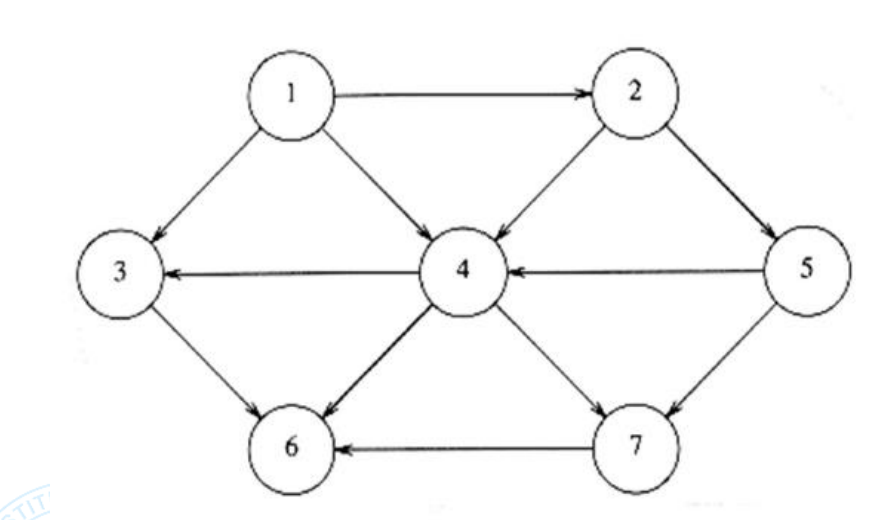

In [183]:
adj_matrix = [[0, 1 / 3, 1 / 3, 1 / 3, 0, 0, 0], [0, 0, 0, 1 / 2, 1 / 2, 0, 0],
              [0, 0, 0, 0, 0, 1, 0], [0, 0, 1 / 3, 0, 0, 1 / 3, 1 / 3],
              [0, 0, 0, 1 / 2, 0, 0, 1 / 2], [0, 0, 0, 0, 0, 0, 0],
              [0, 0, 0, 0, 0, 1, 0]]

In [184]:
adj_matrix

[[0, 0.3333333333333333, 0.3333333333333333, 0.3333333333333333, 0, 0, 0],
 [0, 0, 0, 0.5, 0.5, 0, 0],
 [0, 0, 0, 0, 0, 1, 0],
 [0, 0, 0.3333333333333333, 0, 0, 0.3333333333333333, 0.3333333333333333],
 [0, 0, 0, 0.5, 0, 0, 0.5],
 [0, 0, 0, 0, 0, 0, 0],
 [0, 0, 0, 0, 0, 1, 0]]

## fix stoch

In [185]:
fixed = []

In [186]:
for a in adj_matrix:
    if np.count_nonzero(a) == 0:
        fixed.append((np.ones((1, 7)) / 7).tolist()[0])
    else:
        fixed.append(a)

In [187]:
# eq -> ((1-d)*e/n + d*adj_matrix.T)*P

In [188]:
fixed

[[0, 0.3333333333333333, 0.3333333333333333, 0.3333333333333333, 0, 0, 0],
 [0, 0, 0, 0.5, 0.5, 0, 0],
 [0, 0, 0, 0, 0, 1, 0],
 [0, 0, 0.3333333333333333, 0, 0, 0.3333333333333333, 0.3333333333333333],
 [0, 0, 0, 0.5, 0, 0, 0.5],
 [0.14285714285714285,
  0.14285714285714285,
  0.14285714285714285,
  0.14285714285714285,
  0.14285714285714285,
  0.14285714285714285,
  0.14285714285714285],
 [0, 0, 0, 0, 0, 1, 0]]

In [189]:
adj_matrix = np.matrix(fixed)

In [190]:
n = len(adj_matrix)
n

7

In [191]:
e = np.ones((n, 1))
e

array([[1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.]])

In [192]:
d = 0.9

In [193]:
p = np.ones((n, 1)) / n
p

array([[0.14285714],
       [0.14285714],
       [0.14285714],
       [0.14285714],
       [0.14285714],
       [0.14285714],
       [0.14285714]])

In [194]:
for a in range(100):
    if any([x < 0.05 for x in p]):
        break
#         print(a)
    else:
        p = ((1 - d) * (e / n) + d * adj_matrix.T) * p
p

matrix([[0.03265306],
        [0.0755102 ],
        [0.11836735],
        [0.20408163],
        [0.09693878],
        [0.33265306],
        [0.13979592]])

In [195]:
for a in range(100):
    p = ((1 - d) * (e / n) + d * adj_matrix.T) * p
    p
p

matrix([[0.05899738],
        [0.0766966 ],
        [0.12268358],
        [0.15328994],
        [0.09351085],
        [0.34775741],
        [0.14706425]])

# Question 4

Write a program to implement HITS algorithm for the graph shown in Question No. 3
and display the final authority score and hub score of all the nodes after stopping
criteria is attained. (Note.: Consider the same criteria as mentioned for Question
No. 3)


In [70]:
adj_matrix = np.matrix([[0, 1 / 3, 1 / 3, 1 / 3, 0, 0, 0],
                        [0, 0, 0, 1 / 2, 1 / 2, 0, 0], [0, 0, 0, 0, 0, 1, 0],
                        [0, 0, 1 / 3, 0, 0, 1 / 3, 1 / 3],
                        [0, 0, 0, 1 / 2, 0, 0, 1 / 2], [0, 0, 0, 0, 0, 0, 0],
                        [0, 0, 0, 0, 0, 1, 0]])

In [71]:
adj_matrix

matrix([[0.        , 0.33333333, 0.33333333, 0.33333333, 0.        ,
         0.        , 0.        ],
        [0.        , 0.        , 0.        , 0.5       , 0.5       ,
         0.        , 0.        ],
        [0.        , 0.        , 0.        , 0.        , 0.        ,
         1.        , 0.        ],
        [0.        , 0.        , 0.33333333, 0.        , 0.        ,
         0.33333333, 0.33333333],
        [0.        , 0.        , 0.        , 0.5       , 0.        ,
         0.        , 0.5       ],
        [0.        , 0.        , 0.        , 0.        , 0.        ,
         0.        , 0.        ],
        [0.        , 0.        , 0.        , 0.        , 0.        ,
         1.        , 0.        ]])

In [72]:
u = np.matrix([[1], [1], [1], [1], [1], [1], [1]])
v = np.matrix([[1], [1], [1], [1], [1], [1], [1]])
At = np.transpose(adj_matrix)
e = 0.05
v = At * u
u = adj_matrix * v
pv, pu = v, u

In [73]:
while (((v - pv) < e).all() and ((u - pu) < e).all()):
    v = At * u
    u = adj_matrix * v
    print("authority score=", v)
    print("hub score=", u)
#     if():
#         break

authority score= [[0.        ]
 [0.25925926]
 [0.68518519]
 [1.25925926]
 [0.45833333]
 [5.09259259]
 [0.96759259]]
hub score= [[0.7345679 ]
 [0.8587963 ]
 [5.09259259]
 [2.24845679]
 [1.11342593]
 [0.        ]
 [5.09259259]]


In [74]:
v, u

(matrix([[0.        ],
         [0.25925926],
         [0.68518519],
         [1.25925926],
         [0.45833333],
         [5.09259259],
         [0.96759259]]),
 matrix([[0.7345679 ],
         [0.8587963 ],
         [5.09259259],
         [2.24845679],
         [1.11342593],
         [0.        ],
         [5.09259259]]))

In [75]:
u = np.matrix([[1], [1], [1], [1], [1], [1], [1]])
v = np.matrix([[1], [1], [1], [1], [1], [1], [1]])
At = np.transpose(adj_matrix)
e = 0.05
v = At * u
u = adj_matrix * v
pv, pu = v, u

In [76]:
for i in range(200):
    v = At * u
    u = adj_matrix * v
    print("authority score=", v)
    print("hub score=", u)
    if (((v - pv) < e).all() and ((u - pu) < e).all()):
        break

authority score= [[0.        ]
 [0.25925926]
 [0.68518519]
 [1.25925926]
 [0.45833333]
 [5.09259259]
 [0.96759259]]
hub score= [[0.7345679 ]
 [0.8587963 ]
 [5.09259259]
 [2.24845679]
 [1.11342593]
 [0.        ]
 [5.09259259]]
authority score= [[ 0.        ]
 [ 0.24485597]
 [ 0.99434156]
 [ 1.23096708]
 [ 0.42939815]
 [10.93467078]
 [ 1.30619856]]
hub score= [[ 0.8233882 ]
 [ 0.83018261]
 [10.93467078]
 [ 4.41173697]
 [ 1.26858282]
 [ 0.        ]
 [10.93467078]]
authority score= [[ 0.        ]
 [ 0.27446273]
 [ 1.74504172]
 [ 1.32384545]
 [ 0.41509131]
 [23.33992055]
 [ 2.1048704 ]]
hub score= [[ 1.11444997]
 [ 0.86946838]
 [23.33992055]
 [ 9.06327756]
 [ 1.71435792]
 [ 0.        ]
 [23.33992055]]
authority score= [[ 0.        ]
 [ 0.37148332]
 [ 3.39257584]
 [ 1.66339647]
 [ 0.43473419]
 [49.70093363]
 [ 3.87827148]]
hub score= [[ 1.80915188]
 [ 1.04906533]
 [49.70093363]
 [18.99059365]
 [ 2.77083398]
 [ 0.        ]
 [49.70093363]]
authority score= [[  0.        ]
 [  0.60305063]
 [  6

In [77]:
u, v

(matrix([[2.22150672e+64],
         [7.47684331e+63],
         [7.84965677e+65],
         [2.96456453e+65],
         [3.38160348e+64],
         [0.00000000e+00],
         [7.84965677e+65]]),
 matrix([[0.00000000e+00],
         [3.48325861e+63],
         [4.99667775e+64],
         [1.31951653e+64],
         [1.75852128e+63],
         [7.84965677e+65],
         [5.44369043e+64]]))